In [58]:
#importing the python libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # visualizing data
%matplotlib inline
import seaborn as sns

In [59]:
#import csv file
df = pd.read_csv('listings.csv', encoding= 'unicode_escape')

In [60]:
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,1.090000e+02,Condo in Culver City Â· 2 bedrooms Â· 2 beds Â...,521,Paolo,Other Cities,Culver City,33.983010,-118.386070,Entire home/apt,129,30,2,5/15/2016,0.01,1,180,0,NaN
1,2.708000e+03,Rental unit in Los Angeles Â· â 4.85 Â· 1 bed...,3008,Chas.,City of Los Angeles,Hollywood,34.096250,-118.346050,Private room,94,30,40,7/31/2023,0.35,2,271,2,NaN
2,2.732000e+03,Rental unit in Santa Monica Â· â 4.41 Â· 1 be...,3041,Yoga Priestess,Other Cities,Santa Monica,34.004400,-118.480950,Private room,179,7,24,8/21/2022,0.16,2,360,0,228269
3,6.341600e+04,Home in Hollywood Â· â 4.99 Â· 1 bedroom Â· 2...,309512,Vincenzo,City of Los Angeles,Hollywood Hills,34.113440,-118.323990,Private room,220,2,161,11/18/2023,1.02,3,0,23,HSR21-000113
4,2.864000e+03,Rental unit in Bellflower Â· 1 bedroom Â· 1 be...,3207,Bernadine,Other Cities,Bellflower,33.874900,-118.115150,Entire home/apt,50,30,0,NaN,NaN,1,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45590,1.036570e+18,Home in Whittier Â· â New Â· 3 bedrooms Â· 3 ...,272903865,Peter,Other Cities,Whittier,33.994012,-118.040152,Entire home/apt,392,1,0,NaN,NaN,2,68,0,NaN
45591,1.037660e+18,Guesthouse in Lawndale Â· â New Â· Studio Â· ...,41272244,Karina,Other Cities,Lawndale,33.878159,-118.347681,Entire home/apt,95,1,0,NaN,NaN,1,269,0,NaN
45592,1.036590e+18,Home in Alhambra Â· â New Â· 1 bedroom Â· 1 b...,548780760,Anita,Other Cities,Alhambra,34.074170,-118.131870,Private room,40,1,0,NaN,NaN,9,235,0,NaN
45593,1.036600e+18,Home in Burbank Â· â New Â· 3 bedrooms Â· 4 b...,521839237,Ariena,Other Cities,Burbank,34.146740,-118.341910,Entire home/apt,216,3,0,NaN,NaN,31,269,0,NaN


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45595 entries, 0 to 45594
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              45595 non-null  float64
 1   name                            45595 non-null  object 
 2   host_id                         45595 non-null  int64  
 3   host_name                       45575 non-null  object 
 4   neighbourhood_group             45595 non-null  object 
 5   neighbourhood                   45595 non-null  object 
 6   latitude                        45595 non-null  float64
 7   longitude                       45595 non-null  float64
 8   room_type                       45595 non-null  object 
 9   price                           45595 non-null  int64  
 10  minimum_nights                  45595 non-null  int64  
 11  number_of_reviews               45595 non-null  int64  
 12  last_review                     

In [62]:
df['price'].mean()

292.42811711810504

In [63]:
df.groupby(['room_type'])['price'].mean()

room_type
Entire home/apt    334.452073
Hotel room         773.045455
Private room       175.169106
Shared room         67.484252
Name: price, dtype: float64

In [64]:
df.groupby(['neighbourhood'])['price'].mean()

neighbourhood
Acton              195.933333
Adams-Normandie     98.456522
Agoura Hills       333.960000
Agua Dulce         313.190476
Alhambra           173.162749
                      ...    
Willowbrook        149.461538
Wilmington         110.636364
Windsor Square     236.000000
Winnetka           171.980769
Woodland Hills     299.192381
Name: price, Length: 266, dtype: float64

In [65]:
#Average_price of property according to the location
avg_preffered_price_df = df.groupby(['neighbourhood_group','room_type'], as_index=False)['price'].mean().rename(columns={'neighbourhood_group':'Location','price':'Average Price'})
avg_preffered_price_df

,Location,room_type,Average Price
0,City of Los Angeles,Entire home/apt,345.048516
1,City of Los Angeles,Hotel room,2468.058824
2,City of Los Angeles,Private room,134.613502
3,City of Los Angeles,Shared room,62.873857
4,Other Cities,Entire home/apt,329.444336
5,Other Cities,Hotel room,184.979592
6,Other Cities,Private room,234.630573
7,Other Cities,Shared room,86.885057
8,Unincorporated Areas,Entire home/apt,293.017253
9,Unincorporated Areas,Private room,78.785661


In [66]:
avg_preffered_price_df = df.groupby(['neighbourhood_group','room_type'])['price'].mean().unstack()
avg_preffered_price_df

room_type,Entire home/apt,Hotel room,Private room,Shared room
neighbourhood_group,,,,
City of Los Angeles,345.048516,2468.058824,134.613502,62.873857
Other Cities,329.444336,184.979592,234.630573,86.885057
Unincorporated Areas,293.017253,NaN,78.785661,46.658537


<AxesSubplot:xlabel='neighbourhood_group'>

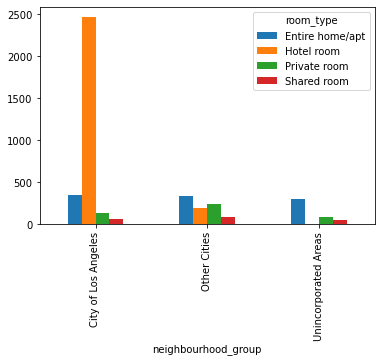

In [67]:
#Graph of average price of property according to location
avg_preffered_price_df.plot.bar()

In [68]:
df.groupby(['neighbourhood_group','room_type'])['id'].count()

neighbourhood_group   room_type      
City of Los Angeles   Entire home/apt    17623
                      Hotel room            17
                      Private room        4414
                      Shared room          547
Other Cities          Entire home/apt    13312
                      Hotel room            49
                      Private room        5181
                      Shared room          174
Unincorporated Areas  Entire home/apt     2898
                      Private room        1339
                      Shared room           41
Name: id, dtype: int64

In [69]:
df['price'].describe()

count    45595.000000
mean       292.428117
std       1034.911930
min          5.000000
25%         90.000000
50%        148.000000
75%        249.000000
max      99999.000000
Name: price, dtype: float64

Text(0.5, 1.0, 'Neighbourhood Group')

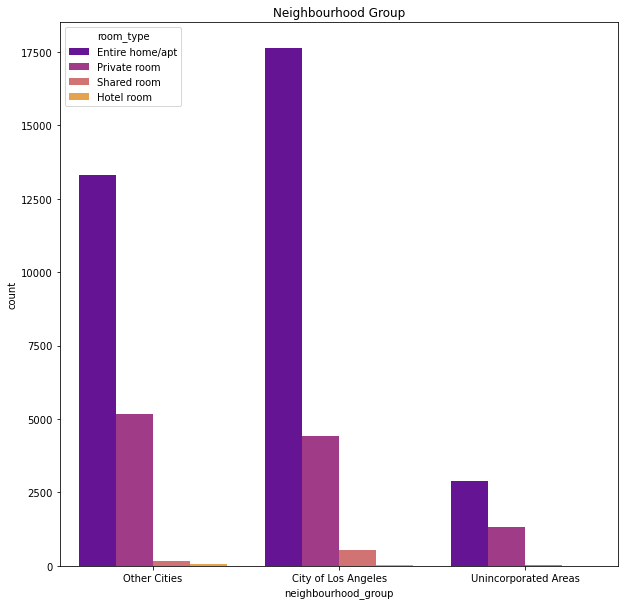

In [70]:
sns.countplot(x='neighbourhood_group', hue='room_type', data=df, palette='plasma')
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Neighbourhood Group')

In [71]:
area_reviews = df.groupby(['neighbourhood_group'])['number_of_reviews'].count()
area_reviews


neighbourhood_group
City of Los Angeles     22601
Other Cities            18716
Unincorporated Areas     4278
Name: number_of_reviews, dtype: int64

Text(0.5, 1.0, 'Neighbourhood Group')

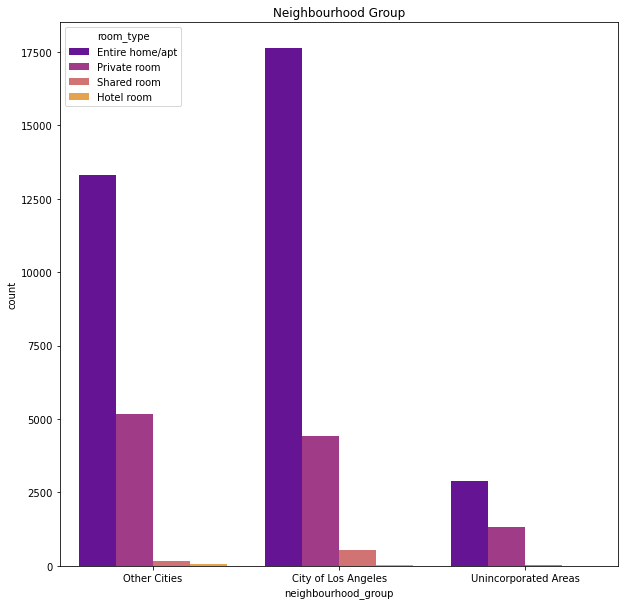

In [72]:
sns.countplot(x='neighbourhood_group', hue='room_type', data=df, palette='plasma')
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Neighbourhood Group')

In [73]:
no_of_host_per_location = df.groupby('neighbourhood_group',as_index=False)['host_id'].count().sort_values(['host_id'], ascending=False).rename(columns={'neighbourhood_group':'Location','host_id':'Host'})
no_of_host_per_location

,Location,Host
0,City of Los Angeles,22601
1,Other Cities,18716
2,Unincorporated Areas,4278


Text(0.5, 0, 'Location')

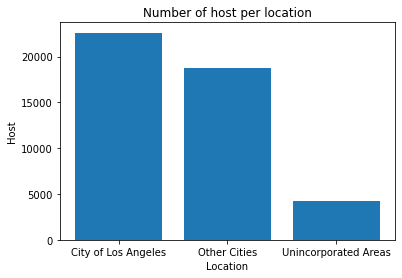

In [74]:
#Graph
x=no_of_host_per_location['Location']
y=no_of_host_per_location['Host']
plt.bar(x,y)
plt.title('Number of host per location')
plt.ylabel('Host')
plt.xlabel('Location')


In [75]:
#Get the highest rent according to location
max_price_df = df.groupby('neighbourhood_group',as_index=False)['price'].max().sort_values(['price'],ascending = False).rename(columns = {'price':'Maximum price','neighbourhood_group':'Location'})
max_price_df


,Location,Maximum price
1,Other Cities,99999
0,City of Los Angeles,79000
2,Unincorporated Areas,30000


In [76]:
#Get the highest rent according to location
min_price_df = df.groupby('neighbourhood_group',as_index=False)['price'].min().sort_values(['price'],ascending = False).rename(columns = {'price':'Maximum price','neighbourhood_group':'Location'})
min_price_df


,Location,Maximum price
2,Unincorporated Areas,11
1,Other Cities,10
0,City of Los Angeles,5


In [77]:
#Get the combine dataframe of minimum and maximum price according to location
merge_price_df = pd.merge(max_price_df, min_price_df, on='Location')
merge_price_df

,Location,Maximum price_x,Maximum price_y
0,Other Cities,99999,10
1,City of Los Angeles,79000,5
2,Unincorporated Areas,30000,11


In [78]:
#Get the host based on number of reviews
host_based_on_review_df = df.groupby(['host_id'],as_index=False)['number_of_reviews'].sum().sort_values(['number_of_reviews'],ascending = False)
host_based_on_review_df

,host_id,number_of_reviews
10390,64165193,6043
1441,2622454,5163
20366,442827977,4004
4322,12102385,3540
16078,213959518,3143
...,...,...
18402,340743428,0
18401,340736981,0
9364,50694297,0
9365,50694454,0


In [79]:
#Get the host based on availability in a year
host_based_on_availability_df = df.groupby(['host_id'],as_index=False)['availability_365'].mean().sort_values(['availability_365'],ascending = True)
host_based_on_availability_df

,host_id,availability_365
5802,20929572,0.0
4763,14733421,0.0
4762,14727811,0.0
16751,241365586,0.0
4756,14691036,0.0
...,...,...
1946,3890783,365.0
7077,29749177,365.0
19043,379642563,365.0
7153,30363328,365.0


In [80]:
popular_host_df = pd.merge(host_based_on_review_df,host_based_on_availability_df,on = ['host_id']).sort_values(['availability_365','number_of_reviews'],ascending = [True,False]).rename(columns = {'number_of_reviews':'Number of reviews','availability_365':'Availability in a year'})

popular_host_df

,host_id,Number of reviews,Availability in a year
49,295744253,1392,0.0
64,215804,1275,0.0
68,21825058,1220,0.0
72,26280918,1208,0.0
74,78921524,1192,0.0
...,...,...,...
22755,51143459,0,365.0
22801,52564310,0,365.0
22850,49477971,0,365.0
22862,344720638,0,365.0


In [81]:
popular_host_df.head(10)

,host_id,Number of reviews,Availability in a year
49,295744253,1392,0.0
64,215804,1275,0.0
68,21825058,1220,0.0
72,26280918,1208,0.0
74,78921524,1192,0.0
138,82937391,910,0.0
162,17222883,854,0.0
165,36097032,844,0.0
168,16262088,832,0.0
170,6471245,829,0.0


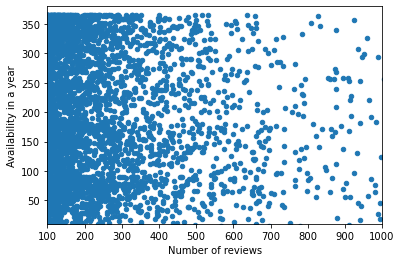

In [82]:
popular_host_df.plot.scatter(x='Number of reviews', y='Availability in a year', xlim=(100,1000),ylim=(10,380));

In [83]:
price_area = df.groupby(['price'])['number_of_reviews'].max().reset_index()
price_area.head(10)


,price,number_of_reviews
0,5,3
1,10,61
2,11,7
3,12,1
4,13,64
5,14,32
6,15,5
7,16,1
8,17,5
9,18,8


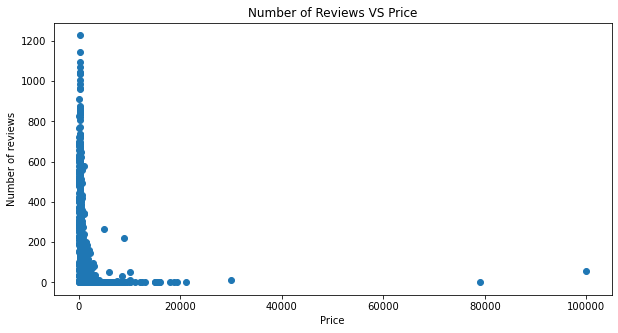

In [84]:
price_list = price_area['price']
review = price_area['number_of_reviews']
fig =plt.figure(figsize =(10,5))

plt.scatter(price_list, review)
plt.xlabel('Price')
plt.ylabel('Number of reviews')
plt.title('Number of Reviews VS Price')
plt.show()


In [85]:
a = np.corrcoef(df['price'],df['minimum_nights'])
print('Correlations between price and minimum nights\n',a)


Correlations between price and minimum nights
 [[ 1.00000000e+00 -4.44985768e-04]
 [-4.44985768e-04  1.00000000e+00]]


In [86]:
b = np.corrcoef(df['price'],df['number_of_reviews'])
print('Correlations between price and number of reviews \n',b)

Correlations between price and number of reviews 
 [[ 1.         -0.04555798]
 [-0.04555798  1.        ]]


In [87]:
c = np.corrcoef(df['price'],df['availability_365'])
print('Correlations between price and availability in a year\n',c)

Correlations between price and availability in a year
 [[1.         0.04731144]
 [0.04731144 1.        ]]


In [88]:
d = np.corrcoef(df['minimum_nights'],df['number_of_reviews'])
print('Correlations between minimum nights and number of reviews\n',d)

Correlations between minimum nights and number of reviews
 [[ 1.         -0.11803415]
 [-0.11803415  1.        ]]


In [89]:
e = np.corrcoef(df['minimum_nights'],df['availability_365'])
print('Correlations between minimum nights and availability in a year\n',e)

Correlations between minimum nights and availability in a year
 [[1.        0.0223563]
 [0.0223563 1.       ]]


In [90]:
f = np.corrcoef(df['number_of_reviews'],df['availability_365'])
print('Correlations between number of reviews and availability in a year\n',f)

Correlations between number of reviews and availability in a year
 [[ 1.        -0.0788282]
 [-0.0788282  1.       ]]


In [91]:
pip install geopandas


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [92]:
import geopandas as gpd


In [93]:
import plotly.express as px

color_scale = [(0, 'orange'), (1, 'red')]

fig = px.scatter_mapbox(df,
                        lat="latitude",
                        lon="longitude",
                        hover_name="neighbourhood",
                        hover_data=["neighbourhood", "availability_365"],
                        color="price",
                        color_continuous_scale=color_scale,
                        size="price",
                        zoom=8,
                        height=800,
                        width=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})  # Fixed the key for left margin
fig.show()

C:\ProgramData\Anaconda3\lib\site-packages\plotly\express\_core.py:1988: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

